# Shrimp Disease YOLO Segmentation Benchmark — Kaggle Complete Notebook

Notebook này được thiết kế để chạy trên **Kaggle GPU** cho benchmark YOLO segmentation nhiều phiên bản, đồng thời **giữ cơ chế tải dataset từ Roboflow giống notebook gốc**.

Các model benchmark mặc định:

- `yolov8n-seg.pt`
- `yolo11n-seg.pt`
- `yolo26n-seg.pt`

Đầu ra gồm phân bổ class, kiểm tra label, split chống leakage, xử lý imbalance, train/val/test metrics, plot predict, inference benchmark và file CSV tổng hợp.


## 0. Kiểm tra GPU và môi trường

Trên Kaggle, hãy bật GPU trong: `Notebook settings -> Accelerator -> GPU T4/P100`.

In [1]:
!nvidia-smi || true
!python --version

Fri May 29 12:43:49 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.08             Driver Version: 580.105.08     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   47C    P8             13W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 1. Cài thư viện

Nếu Kaggle tắt Internet, hãy bật `Internet = On` trong settings. Nếu môi trường đã có sẵn `ultralytics`, cell này sẽ chỉ cập nhật/kiểm tra lại.

In [2]:
# %pip install -U -q ultralytics roboflow pandas matplotlib opencv-python pyyaml tqdm scikit-learn seaborn


## 2. Import và cấu hình chung

Bạn chỉ cần chỉnh các biến trong cell này nếu muốn thay đổi dataset/model/epoch.

In [3]:
import os
import re
import json
import yaml
import time
import math
import random
import shutil
import warnings
from pathlib import Path
from collections import Counter, defaultdict

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split

warnings.filterwarnings("ignore")
os.environ["WANDB_DISABLED"] = "true"
os.environ["ULTRALYTICS_SETTINGS"] = "true"

try:
    import torch
    print("Torch:", torch.__version__)
    print("CUDA available:", torch.cuda.is_available())
    if torch.cuda.is_available():
        print("GPU:", torch.cuda.get_device_name(0))
except Exception as e:
    print("Torch check failed:", e)

from ultralytics import YOLO

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# =========================
# DATASET CONFIG
# =========================
# Chọn một trong ba chế độ:
# - "roboflow": tải dataset trực tiếp từ Roboflow giống notebook gốc của bạn
# - "auto_kaggle": tự tìm data.yaml trong /kaggle/input nếu bạn đã add dataset Kaggle
# - "manual": dùng RAW_DATASET_DIR bên dưới
DATA_SOURCE = "roboflow"

# Nếu DATA_SOURCE="manual", sửa đường dẫn này.
RAW_DATASET_DIR = "/kaggle/input/your-yolo-seg-dataset"

# Nếu DATA_SOURCE="roboflow", cấu hình tại đây giống notebook gốc.
# Cách an toàn trên Kaggle: Add-ons -> Secrets -> tạo secret tên ROBOFLOW_API_KEY.
# Nếu muốn test nhanh, bạn có thể dán key vào ROBOFLOW_API_KEY_DIRECT, nhưng không nên commit/public notebook có key.
ROBOFLOW_API_KEY_DIRECT = ""
ROBOFLOW_WORKSPACE = "shirmpdiseasedtection"
ROBOFLOW_PROJECT = "ewu_shrimp_disease"
ROBOFLOW_VERSION = 1
ROBOFLOW_FORMAT = "yolov8"

# Thư mục làm việc. Kaggle cho phép ghi vào /kaggle/working.
WORK_DIR = Path("/kaggle/working/shrimp_yolo_seg_benchmark")
RAW_WORK_DIR = WORK_DIR / "raw_dataset"
SPLIT_NATURAL_DIR = WORK_DIR / "split_natural"
SPLIT_BALANCED_DIR = WORK_DIR / "split_balanced"
RUNS_DIR = WORK_DIR / "runs"
EXPORT_DIR = WORK_DIR / "exports"
PLOTS_DIR = WORK_DIR / "plots"
PRED_DIR = WORK_DIR / "predictions"

for d in [WORK_DIR, RAW_WORK_DIR, SPLIT_NATURAL_DIR, SPLIT_BALANCED_DIR, RUNS_DIR, EXPORT_DIR, PLOTS_DIR, PRED_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# =========================
# SPLIT CONFIG
# =========================
TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

# Nếu tên file Roboflow dạng xxx.rf.hash.jpg, group_id sẽ lấy phần trước .rf.
USE_ROBOFLOW_GROUP_ID = True

# =========================
# IMBALANCE CONFIG
# =========================
# Các kỹ thuật dùng trong notebook:
# 1) group-aware split chống leakage
# 2) oversample train theo image signature
# 3) cap số ảnh empty/negative nếu quá nhiều
# 4) augmentation trong YOLO train
BALANCE_TRAIN = True
EMPTY_RATIO_TO_MAX_DISEASE = 1.0  # empty train target <= max_disease_signature * ratio
MIN_TARGET_PER_DISEASE_SIGNATURE = None  # None = dùng max count hiện có giữa các disease signature
MAX_DUPLICATE_FACTOR = 8  # tránh duplicate quá mức một ảnh

# =========================
# TRAIN CONFIG
# =========================
IMG_SIZE = 640
EPOCHS = 50
BATCH = 8
PATIENCE = 10
DEVICE = 0
WORKERS = 2
CACHE = True  # Kaggle RAM có hạn, đặt True nếu dataset nhỏ
CONF_THRES = 0.25
IOU_THRES = 0.50

# Có thể đổi sang s/m nếu GPU mạnh hơn.
MODEL_CANDIDATES = {
    "yolov8m-seg": "yolov8m-seg.pt",
    "yolo11m-seg": "yolo11m-seg.pt",
    "yolo26m-seg": "yolo26m-seg.pt",
}

# Nếu muốn test nhanh trước, đặt True để train 1-3 epoch.
SMOKE_TEST = False
if SMOKE_TEST:
    EPOCHS = 3
    BATCH = 4

print("WORK_DIR:", WORK_DIR)

Torch: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4
WORK_DIR: /kaggle/working/shrimp_yolo_seg_benchmark


## 3. Tải dataset từ Roboflow giống notebook gốc

Mặc định notebook sẽ tải dataset trực tiếp từ Roboflow:

```python
workspace = "shirmpdiseasedtection"
project = "ewu_shrimp_disease"
version = 1
format = "yolov8"
```

Trên Kaggle, cách an toàn là thêm API key vào `Add-ons -> Secrets` với tên `ROBOFLOW_API_KEY`. Nếu bạn đã add dataset vào `/kaggle/input`, có thể đổi `DATA_SOURCE = "auto_kaggle"`.


In [4]:
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


def find_data_yaml(root="/kaggle/input"):
    root = Path(root)
    candidates = []
    if root.exists():
        for p in root.rglob("*.yaml"):
            if p.name.lower() in {"data.yaml", "dataset.yaml"}:
                candidates.append(p)
    return sorted(candidates, key=lambda p: len(str(p)))


def copy_dataset_to_work(src_dir, dst_dir):
    src_dir = Path(src_dir)
    dst_dir = Path(dst_dir)
    if dst_dir.exists():
        shutil.rmtree(dst_dir)
    print(f"Copy dataset:\n  from: {src_dir}\n  to:   {dst_dir}")
    shutil.copytree(src_dir, dst_dir)
    return dst_dir


def download_roboflow_dataset():
    # Ưu tiên 1: key dán trực tiếp trong ROBOFLOW_API_KEY_DIRECT nếu bạn muốn chạy nhanh.
    api_key = str('SQB5cSExBZTdiNjecdqF').strip()

    # Ưu tiên 2: Kaggle Secrets, khuyến nghị dùng cách này.
    if not api_key:
        try:
            from kaggle_secrets import UserSecretsClient
            api_key = UserSecretsClient().get_secret("ROBOFLOW_API_KEY")
        except Exception:
            api_key = ""

    # Ưu tiên 3: biến môi trường.
    if not api_key:
        api_key = os.environ.get("ROBOFLOW_API_KEY", "")

    if not api_key:
        raise RuntimeError(
            "Không tìm thấy ROBOFLOW_API_KEY. Trên Kaggle hãy vào Add-ons -> Secrets để thêm secret tên ROBOFLOW_API_KEY, "
            "hoặc dán tạm key vào ROBOFLOW_API_KEY_DIRECT, hoặc đổi DATA_SOURCE='auto_kaggle'/'manual'."
        )

    from roboflow import Roboflow

    print("Downloading Roboflow dataset...")
    print("Workspace:", ROBOFLOW_WORKSPACE)
    print("Project:", ROBOFLOW_PROJECT)
    print("Version:", ROBOFLOW_VERSION)
    print("Format:", ROBOFLOW_FORMAT)

    rf = Roboflow(api_key=api_key)
    project = rf.workspace(ROBOFLOW_WORKSPACE).project(ROBOFLOW_PROJECT)
    version = project.version(ROBOFLOW_VERSION)

    # Tải về /kaggle/working để Kaggle có quyền ghi.
    if RAW_WORK_DIR.exists():
        shutil.rmtree(RAW_WORK_DIR)
    dataset = version.download(ROBOFLOW_FORMAT, location=str(RAW_WORK_DIR))
    return Path(dataset.location)


if DATA_SOURCE == "auto_kaggle":
    yamls = find_data_yaml("/kaggle/input")
    print("Found YAML files:")
    for i, y in enumerate(yamls):
        print(f"[{i}] {y}")
    if not yamls:
        raise FileNotFoundError("Không tìm thấy data.yaml trong /kaggle/input. Hãy add dataset hoặc dùng DATA_SOURCE='manual'/'roboflow'.")
    SOURCE_YAML = yamls[0]
    SOURCE_ROOT = SOURCE_YAML.parent
    RAW_ROOT = copy_dataset_to_work(SOURCE_ROOT, RAW_WORK_DIR)
elif DATA_SOURCE == "manual":
    SOURCE_ROOT = Path(RAW_DATASET_DIR)
    if not SOURCE_ROOT.exists():
        raise FileNotFoundError(f"RAW_DATASET_DIR không tồn tại: {SOURCE_ROOT}")
    RAW_ROOT = copy_dataset_to_work(SOURCE_ROOT, RAW_WORK_DIR)
elif DATA_SOURCE == "roboflow":
    RAW_ROOT = download_roboflow_dataset()
else:
    raise ValueError("DATA_SOURCE phải là auto_kaggle, manual hoặc roboflow")

print("RAW_ROOT:", RAW_ROOT)
print("Number of images:", sum(1 for p in RAW_ROOT.rglob("*") if p.suffix.lower() in IMAGE_EXTS))
print("Number of txt labels:", sum(1 for p in RAW_ROOT.rglob("*.txt")))

Workspace: shirmpdiseasedtection
Project: ewu_shrimp_disease
Version: 1
Format: yolov8
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/shrimp_yolo_seg_benchmark/raw_dataset in yolov8:: 100%|██████████| 2255/2255 [00:00<00:00, 3082.78it/s]

RAW_ROOT: /kaggle/working/shrimp_yolo_seg_benchmark/raw_dataset
Number of images: 1126
Number of txt labels: 1128


## 4. Đọc `data.yaml`, chuẩn hóa tên class và đường dẫn label

Cell này hỗ trợ cả dataset đã có `train/valid/test` lẫn dataset trộn chung. Notebook sẽ gom toàn bộ ảnh rồi tự split lại để đảm bảo cùng một test set cho tất cả model.

In [5]:
def load_yaml_if_exists(root):
    root = Path(root)
    candidates = list(root.rglob("data.yaml")) + list(root.rglob("dataset.yaml"))
    if not candidates:
        return None, None
    ypath = sorted(candidates, key=lambda p: len(str(p)))[0]
    with open(ypath, "r", encoding="utf-8") as f:
        data = yaml.safe_load(f)
    return ypath, data


def normalize_names(names):
    if names is None:
        return []
    if isinstance(names, dict):
        return [names[k] for k in sorted(names.keys(), key=lambda x: int(x))]
    if isinstance(names, list):
        return names
    raise ValueError(f"Unsupported names format: {type(names)}")

DATA_YAML_RAW, RAW_YAML = load_yaml_if_exists(RAW_ROOT)
print("Detected raw yaml:", DATA_YAML_RAW)
print("Raw yaml content:", RAW_YAML)

CLASS_NAMES = normalize_names(RAW_YAML.get("names")) if RAW_YAML else []
if not CLASS_NAMES:
    # fallback: suy ra class id từ label txt
    ids = set()
    for lp in Path(RAW_ROOT).rglob("*.txt"):
        for line in lp.read_text(errors="ignore").splitlines():
            parts = line.strip().split()
            if parts and parts[0].isdigit():
                ids.add(int(parts[0]))
    CLASS_NAMES = [f"class_{i}" for i in range(max(ids) + 1)] if ids else []

print("CLASS_NAMES:", CLASS_NAMES)
print("NUM_CLASSES:", len(CLASS_NAMES))


def label_path_for_image(img_path, dataset_root):
    img_path = Path(img_path)
    dataset_root = Path(dataset_root)
    rel = img_path.relative_to(dataset_root)
    parts = list(rel.parts)

    # Case phổ biến: images/train/a.jpg -> labels/train/a.txt
    if "images" in parts:
        idx = parts.index("images")
        parts[idx] = "labels"
        cand = dataset_root / Path(*parts).with_suffix(".txt")
        return cand

    # Case: train/images/a.jpg -> train/labels/a.txt
    if "image" in [x.lower() for x in parts]:
        pass

    # Fallback 1: sibling labels folder
    cand = img_path.parent.parent / "labels" / f"{img_path.stem}.txt"
    if cand.exists():
        return cand

    # Fallback 2: cùng thư mục
    return img_path.with_suffix(".txt")


def parse_yolo_seg_label(label_path):
    # Return object class ids and validity warnings.
    label_path = Path(label_path)
    class_ids = []
    bad_lines = []
    if not label_path.exists():
        return class_ids, ["missing_label_file"]
    text = label_path.read_text(errors="ignore").strip()
    if not text:
        return class_ids, []
    for line_no, line in enumerate(text.splitlines(), start=1):
        parts = line.strip().split()
        if len(parts) < 7:
            bad_lines.append(f"line_{line_no}_too_short")
            continue
        try:
            cid = int(float(parts[0]))
            coords = [float(x) for x in parts[1:]]
        except Exception:
            bad_lines.append(f"line_{line_no}_parse_error")
            continue
        if cid < 0:
            bad_lines.append(f"line_{line_no}_negative_class")
            continue
        if len(coords) % 2 != 0:
            bad_lines.append(f"line_{line_no}_odd_polygon_coords")
        if any((x < -1e-6 or x > 1 + 1e-6) for x in coords):
            bad_lines.append(f"line_{line_no}_coords_out_of_range")
        class_ids.append(cid)
    return class_ids, bad_lines


def get_group_id(img_path):
    stem = Path(img_path).stem
    if USE_ROBOFLOW_GROUP_ID and ".rf." in Path(img_path).name:
        return Path(img_path).name.split(".rf.")[0]
    # Roboflow thường tạo stem dạng name_jpg.rf.hash; xử lý thêm bằng regex
    if USE_ROBOFLOW_GROUP_ID:
        m = re.match(r"(.+?)\.rf\.", Path(img_path).name)
        if m:
            return m.group(1)
    return stem

image_paths = sorted([p for p in Path(RAW_ROOT).rglob("*") if p.suffix.lower() in IMAGE_EXTS])
records = []
for img in tqdm(image_paths, desc="Scanning images/labels"):
    lbl = label_path_for_image(img, RAW_ROOT)
    class_ids, warnings_ = parse_yolo_seg_label(lbl)
    unique_ids = sorted(set(class_ids))
    signature = "empty" if not unique_ids else "_".join(map(str, unique_ids))
    records.append({
        "image_path": str(img),
        "label_path": str(lbl),
        "file_name": img.name,
        "stem": img.stem,
        "group_id": get_group_id(img),
        "object_count": len(class_ids),
        "class_ids": unique_ids,
        "signature": signature,
        "warnings": ";".join(warnings_),
        "missing_label": not lbl.exists(),
    })

df = pd.DataFrame(records)
print("Total images:", len(df))
display(df.head())

# Lưu scan report
scan_csv = EXPORT_DIR / "dataset_scan_report.csv"
df.to_csv(scan_csv, index=False)
print("Saved:", scan_csv)

Detected raw yaml: /kaggle/working/shrimp_yolo_seg_benchmark/raw_dataset/data.yaml
Raw yaml content: {'names': ['blackgill', 'whitespot'], 'nc': 2, 'roboflow': {'license': 'CC BY 4.0', 'project': 'ewu_shrimp_disease', 'url': 'https://universe.roboflow.com/shirmpdiseasedtection/ewu_shrimp_disease/dataset/1', 'version': 1, 'workspace': 'shirmpdiseasedtection'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
CLASS_NAMES: ['blackgill', 'whitespot']
NUM_CLASSES: 2


Scanning images/labels:   0%|          | 0/1126 [00:00<?, ?it/s]

Total images: 1126


,image_path,label_path,file_name,stem,group_id,object_count,class_ids,signature,warnings,missing_label
0,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,Shrimp_318-1-_jpg.rf.2a2a215d5bf2fd7002536cdc5...,Shrimp_318-1-_jpg.rf.2a2a215d5bf2fd7002536cdc5...,Shrimp_318-1-_jpg,2,[1],1,,False
1,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,Shrimp_318-2-_jpg.rf.0dbba7d8d0f9fd1951ddb61c5...,Shrimp_318-2-_jpg.rf.0dbba7d8d0f9fd1951ddb61c5...,Shrimp_318-2-_jpg,2,[1],1,,False
2,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,Shrimp_318-3-_jpg.rf.78b0be2d1a0a4256946be8953...,Shrimp_318-3-_jpg.rf.78b0be2d1a0a4256946be8953...,Shrimp_318-3-_jpg,2,[1],1,,False
3,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,Shrimp_319-1-_jpg.rf.1eecb8db66bfa6719aa346e65...,Shrimp_319-1-_jpg.rf.1eecb8db66bfa6719aa346e65...,Shrimp_319-1-_jpg,1,[1],1,,False
4,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,/kaggle/working/shrimp_yolo_seg_benchmark/raw_...,Shrimp_319-2-_jpg.rf.83f6969ca9cfe254c3bd7a2ed...,Shrimp_319-2-_jpg.rf.83f6969ca9cfe254c3bd7a2ed...,Shrimp_319-2-_jpg,2,[1],1,,False


Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/dataset_scan_report.csv


## 5. Phân tích phân bổ class và lỗi annotation

- `empty` = ảnh không có mask/object, thường dùng như negative/healthy sample.
- `signature` = tổ hợp class xuất hiện trong một ảnh, ví dụ `0`, `1`, `0_1`, hoặc `empty`.

RAW DATASET
Images: 1126
Missing labels: 0
Images with warnings: 0
Image-level signature distribution:
signature
empty    552
1        478
0         96
Name: count, dtype: int64
Object-level class distribution:
  0 - blackgill: 101
  1 - whitespot: 960


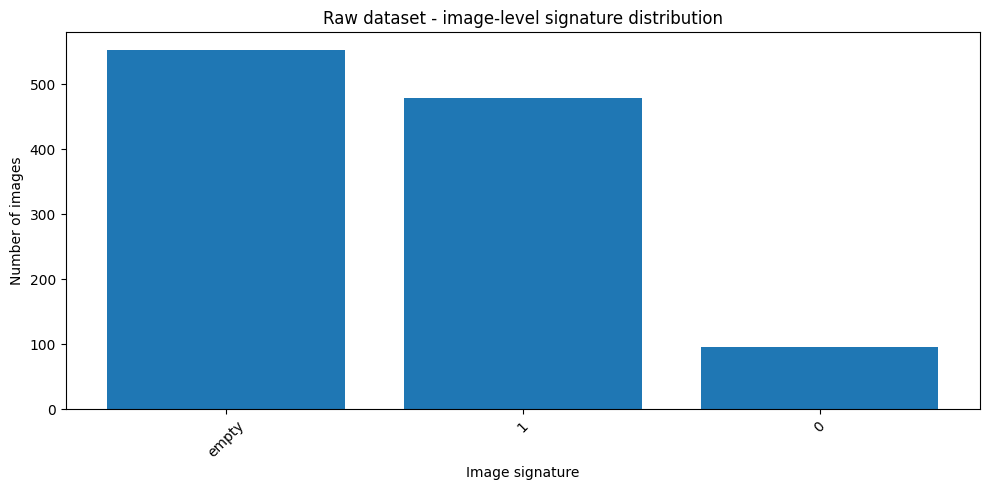

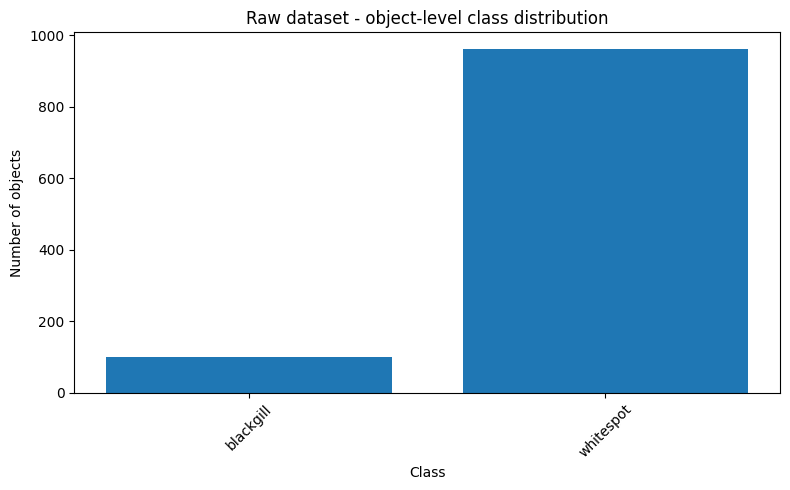

,image_path,label_path,file_name,stem,group_id,object_count,class_ids,signature,warnings,missing_label


In [6]:
def summarize_distribution(dataframe, title="Distribution"):
    print("=" * 80)
    print(title)
    print("Images:", len(dataframe))
    print("Missing labels:", int(dataframe["missing_label"].sum()))
    print("Images with warnings:", int(dataframe["warnings"].astype(bool).sum()))
    print("Image-level signature distribution:")
    print(dataframe["signature"].value_counts())

    obj_counter = Counter()
    for img_path, lbl_path in zip(dataframe["image_path"], dataframe["label_path"]):
        ids, _ = parse_yolo_seg_label(lbl_path)
        obj_counter.update(ids)
    print("Object-level class distribution:")
    for cid in range(len(CLASS_NAMES)):
        print(f"  {cid} - {CLASS_NAMES[cid]}: {obj_counter.get(cid, 0)}")
    return obj_counter

raw_obj_counter = summarize_distribution(df, "RAW DATASET")

# Plot image-level signature
sig_counts = df["signature"].value_counts().reset_index()
sig_counts.columns = ["signature", "count"]
plt.figure(figsize=(10, 5))
plt.bar(sig_counts["signature"], sig_counts["count"])
plt.title("Raw dataset - image-level signature distribution")
plt.xlabel("Image signature")
plt.ylabel("Number of images")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(PLOTS_DIR / "raw_signature_distribution.png", dpi=200)
plt.show()

# Plot object-level class count
obj_df = pd.DataFrame({
    "class": [CLASS_NAMES[i] if i < len(CLASS_NAMES) else str(i) for i in sorted(raw_obj_counter.keys())],
    "count": [raw_obj_counter[i] for i in sorted(raw_obj_counter.keys())]
})
if len(obj_df):
    plt.figure(figsize=(8, 5))
    plt.bar(obj_df["class"], obj_df["count"])
    plt.title("Raw dataset - object-level class distribution")
    plt.xlabel("Class")
    plt.ylabel("Number of objects")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(PLOTS_DIR / "raw_object_class_distribution.png", dpi=200)
    plt.show()

display(df[df["warnings"].astype(bool)].head(20))

## 6. Tạo split train/val/test chống leakage

Notebook split theo `group_id`, không split trực tiếp theo từng file. Điều này giúp tránh trường hợp các biến thể của cùng ảnh gốc rơi vào cả train và test.

In [7]:
def safe_group_split(group_df, test_size, random_state=SEED, strat_col="signature"):
    stratify = None
    if strat_col in group_df.columns:
        counts = group_df[strat_col].value_counts()
        if len(counts) > 1 and counts.min() >= 2:
            stratify = group_df[strat_col]
    return train_test_split(
        group_df,
        test_size=test_size,
        random_state=random_state,
        shuffle=True,
        stratify=stratify,
    )

# Group-level metadata
group_rows = []
for gid, g in df.groupby("group_id"):
    sigs = sorted(set(g["signature"].tolist()))
    # nếu một group có nhiều file và signature khác nhau, lấy union class ids
    union_ids = sorted(set(x for ids in g["class_ids"] for x in ids))
    signature = "empty" if not union_ids else "_".join(map(str, union_ids))
    group_rows.append({
        "group_id": gid,
        "n_images": len(g),
        "signature": signature,
    })

groups_df = pd.DataFrame(group_rows)
print("Total groups:", len(groups_df))
print(groups_df["signature"].value_counts())

temp_ratio = VAL_RATIO + TEST_RATIO
train_groups, temp_groups = safe_group_split(groups_df, test_size=temp_ratio, random_state=SEED)
relative_test_ratio = TEST_RATIO / (VAL_RATIO + TEST_RATIO)
val_groups, test_groups = safe_group_split(temp_groups, test_size=relative_test_ratio, random_state=SEED + 1)

split_map = {}
for gid in train_groups["group_id"]: split_map[gid] = "train"
for gid in val_groups["group_id"]: split_map[gid] = "val"
for gid in test_groups["group_id"]: split_map[gid] = "test"

df["split"] = df["group_id"].map(split_map)
print(df["split"].value_counts())
print(pd.crosstab(df["split"], df["signature"]))

split_report = EXPORT_DIR / "natural_split_report.csv"
df.to_csv(split_report, index=False)
print("Saved:", split_report)

Total groups: 1126
signature
empty    552
1        478
0         96
Name: count, dtype: int64
split
train    788
test     169
val      169
Name: count, dtype: int64
signature   0    1  empty
split                    
test       15   71     83
train      67  335    386
val        14   72     83
Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/natural_split_report.csv


## 7. Copy natural split sang chuẩn YOLO segmentation

Cấu trúc đầu ra:

```text
split_natural/
  images/train, images/val, images/test
  labels/train, labels/val, labels/test
  data.yaml
```

In [8]:
def reset_dir(path):
    path = Path(path)
    if path.exists():
        shutil.rmtree(path)
    path.mkdir(parents=True, exist_ok=True)


def copy_image_label(row, dst_root, split, suffix=""):
    img_src = Path(row["image_path"])
    lbl_src = Path(row["label_path"])
    img_dst_dir = Path(dst_root) / "images" / split
    lbl_dst_dir = Path(dst_root) / "labels" / split
    img_dst_dir.mkdir(parents=True, exist_ok=True)
    lbl_dst_dir.mkdir(parents=True, exist_ok=True)

    new_stem = img_src.stem + suffix
    img_dst = img_dst_dir / f"{new_stem}{img_src.suffix.lower()}"
    lbl_dst = lbl_dst_dir / f"{new_stem}.txt"

    shutil.copy2(img_src, img_dst)
    if lbl_src.exists():
        shutil.copy2(lbl_src, lbl_dst)
    else:
        lbl_dst.write_text("")
    return img_dst, lbl_dst


def write_yolo_data_yaml(root, names):
    root = Path(root)
    data = {
        "path": str(root),
        "train": "images/train",
        "val": "images/val",
        "test": "images/test",
        "nc": len(names),
        "names": names,
    }
    ypath = root / "data.yaml"
    with open(ypath, "w", encoding="utf-8") as f:
        yaml.safe_dump(data, f, sort_keys=False, allow_unicode=True)
    return ypath

reset_dir(SPLIT_NATURAL_DIR)
for split in ["train", "val", "test"]:
    for _, row in tqdm(df[df["split"] == split].iterrows(), total=(df["split"] == split).sum(), desc=f"Copy {split}"):
        copy_image_label(row, SPLIT_NATURAL_DIR, split)

DATA_YAML_NATURAL = write_yolo_data_yaml(SPLIT_NATURAL_DIR, CLASS_NAMES)
print(DATA_YAML_NATURAL.read_text())

Copy train:   0%|          | 0/788 [00:00<?, ?it/s]

Copy val:   0%|          | 0/169 [00:00<?, ?it/s]

Copy test:   0%|          | 0/169 [00:00<?, ?it/s]

path: /kaggle/working/shrimp_yolo_seg_benchmark/split_natural
train: images/train
val: images/val
test: images/test
nc: 2
names:
- blackgill
- whitespot



## 8. Tạo balanced training split để xử lý imbalance

Notebook chỉ cân bằng **train set**, giữ nguyên `val` và `test` để đánh giá công bằng.

Kỹ thuật áp dụng:

1. Giữ group-aware split để tránh leakage.
2. Oversample image-level disease signatures hiếm trong train.
3. Cap số ảnh `empty` nếu empty quá nhiều.
4. Dùng augmentation của YOLO khi train: mosaic, copy-paste, HSV, scale, translate, flip.

In [9]:
def create_balanced_split(natural_dir, balanced_dir, train_df):
    natural_dir = Path(natural_dir)
    balanced_dir = Path(balanced_dir)
    reset_dir(balanced_dir)

    # Copy val/test y nguyên từ natural split
    for split in ["val", "test"]:
        shutil.copytree(natural_dir / "images" / split, balanced_dir / "images" / split)
        shutil.copytree(natural_dir / "labels" / split, balanced_dir / "labels" / split)

    # Tạo train balanced
    (balanced_dir / "images" / "train").mkdir(parents=True, exist_ok=True)
    (balanced_dir / "labels" / "train").mkdir(parents=True, exist_ok=True)

    sig_to_rows = {sig: g.copy() for sig, g in train_df.groupby("signature")}
    disease_sigs = [s for s in sig_to_rows.keys() if s != "empty"]
    empty_count = len(sig_to_rows.get("empty", [])) if "empty" in sig_to_rows else 0
    disease_counts = {s: len(sig_to_rows[s]) for s in disease_sigs}

    if not BALANCE_TRAIN or not disease_sigs:
        target_counts = {s: len(g) for s, g in sig_to_rows.items()}
    else:
        max_disease = max(disease_counts.values()) if disease_counts else 0
        if MIN_TARGET_PER_DISEASE_SIGNATURE is not None:
            max_disease = max(max_disease, int(MIN_TARGET_PER_DISEASE_SIGNATURE))
        target_counts = {s: max_disease for s in disease_sigs}
        if "empty" in sig_to_rows:
            target_counts["empty"] = min(empty_count, int(max_disease * EMPTY_RATIO_TO_MAX_DISEASE))

    print("Original train signature counts:")
    print(train_df["signature"].value_counts())
    print("Target train signature counts:")
    print(target_counts)

    balanced_records = []
    rng = random.Random(SEED)
    for sig, rows in sig_to_rows.items():
        rows_list = rows.to_dict("records")
        target = target_counts.get(sig, len(rows_list))
        if target <= 0:
            continue
        # Nếu cần downsample, lấy ngẫu nhiên target ảnh
        if len(rows_list) >= target:
            selected = rng.sample(rows_list, target)
        else:
            selected = list(rows_list)
            needed = target - len(rows_list)
            # giới hạn duplicate quá mức từng ảnh
            dup_pool = rows_list * MAX_DUPLICATE_FACTOR
            if needed > len(dup_pool):
                print(f"Warning: signature {sig} cần duplicate nhiều hơn MAX_DUPLICATE_FACTOR, sẽ random choices.")
                selected += rng.choices(rows_list, k=needed)
            else:
                selected += rng.sample(dup_pool, needed)

        used_stems = Counter()
        for item in selected:
            stem = Path(item["image_path"]).stem
            used_stems[stem] += 1
            suffix = "" if used_stems[stem] == 1 else f"_dup{used_stems[stem]-1:03d}"
            img_dst, lbl_dst = copy_image_label(item, balanced_dir, "train", suffix=suffix)
            item2 = dict(item)
            item2["balanced_image_path"] = str(img_dst)
            item2["balanced_label_path"] = str(lbl_dst)
            item2["balanced_signature"] = sig
            item2["duplicate_index"] = used_stems[stem] - 1
            balanced_records.append(item2)

    ypath = write_yolo_data_yaml(balanced_dir, CLASS_NAMES)
    bal_df = pd.DataFrame(balanced_records)
    return ypath, bal_df

train_df = df[df["split"] == "train"].copy()
DATA_YAML_BALANCED, balanced_train_df = create_balanced_split(SPLIT_NATURAL_DIR, SPLIT_BALANCED_DIR, train_df)
print(DATA_YAML_BALANCED.read_text())

balanced_train_csv = EXPORT_DIR / "balanced_train_report.csv"
balanced_train_df.to_csv(balanced_train_csv, index=False)
print("Saved:", balanced_train_csv)

Original train signature counts:
signature
empty    386
1        335
0         67
Name: count, dtype: int64
Target train signature counts:
{'0': 335, '1': 335, 'empty': 335}
path: /kaggle/working/shrimp_yolo_seg_benchmark/split_balanced
train: images/train
val: images/val
test: images/test
nc: 2
names:
- blackgill
- whitespot

Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/balanced_train_report.csv


## 9. Plot phân bổ class sau khi split và balance

Natural split:


signature,0,1,empty
split,,,
test,15,71,83
train,67,335,386
val,14,72,83


Balanced split:


signature,0,1,empty
split,,,
test,15,71,83
train,335,335,335
val,14,72,83


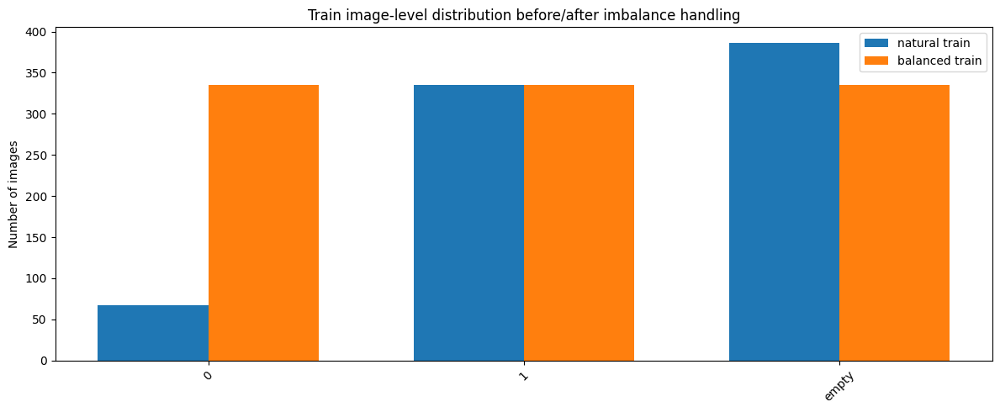

,signature,natural_train,balanced_train
0,0,67,335
1,1,335,335
2,empty,386,335


In [10]:
def scan_split_dir(split_root):
    split_root = Path(split_root)
    rows = []
    for split in ["train", "val", "test"]:
        img_dir = split_root / "images" / split
        if not img_dir.exists():
            continue
        for img in sorted([p for p in img_dir.iterdir() if p.suffix.lower() in IMAGE_EXTS]):
            lbl = split_root / "labels" / split / f"{img.stem}.txt"
            ids, warnings_ = parse_yolo_seg_label(lbl)
            unique_ids = sorted(set(ids))
            sig = "empty" if not unique_ids else "_".join(map(str, unique_ids))
            rows.append({"split": split, "image_path": str(img), "label_path": str(lbl), "signature": sig, "object_count": len(ids), "class_ids": unique_ids})
    return pd.DataFrame(rows)

natural_scan = scan_split_dir(SPLIT_NATURAL_DIR)
balanced_scan = scan_split_dir(SPLIT_BALANCED_DIR)

print("Natural split:")
display(pd.crosstab(natural_scan["split"], natural_scan["signature"]))
print("Balanced split:")
display(pd.crosstab(balanced_scan["split"], balanced_scan["signature"]))

# Plot comparison train signatures natural vs balanced
nat_counts = natural_scan[natural_scan.split == "train"]["signature"].value_counts()
bal_counts = balanced_scan[balanced_scan.split == "train"]["signature"].value_counts()
all_sigs = sorted(set(nat_counts.index) | set(bal_counts.index))
plot_df = pd.DataFrame({
    "signature": all_sigs,
    "natural_train": [nat_counts.get(s, 0) for s in all_sigs],
    "balanced_train": [bal_counts.get(s, 0) for s in all_sigs],
})

x = np.arange(len(all_sigs))
width = 0.35
plt.figure(figsize=(12, 5))
plt.bar(x - width/2, plot_df["natural_train"], width, label="natural train")
plt.bar(x + width/2, plot_df["balanced_train"], width, label="balanced train")
plt.xticks(x, all_sigs, rotation=45)
plt.ylabel("Number of images")
plt.title("Train image-level distribution before/after imbalance handling")
plt.legend()
plt.tight_layout()
plt.savefig(PLOTS_DIR / "natural_vs_balanced_train_distribution.png", dpi=200)
plt.show()

display(plot_df)

## 10. Visualize annotation mẫu

Cell này vẽ polygon ground-truth lên một số ảnh train/val/test để kiểm tra annotation.

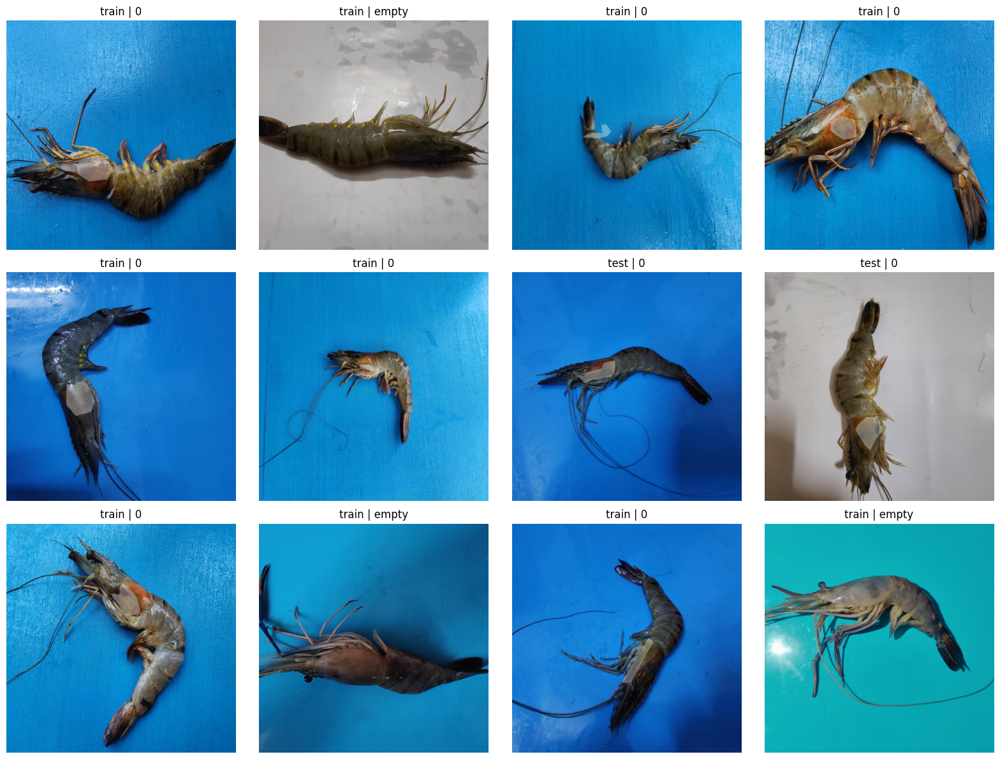

In [11]:
def read_label_polygons(label_path, img_w, img_h):
    polys = []
    label_path = Path(label_path)
    if not label_path.exists() or not label_path.read_text(errors="ignore").strip():
        return polys
    for line in label_path.read_text(errors="ignore").splitlines():
        parts = line.strip().split()
        if len(parts) < 7:
            continue
        cid = int(float(parts[0]))
        coords = np.array([float(x) for x in parts[1:]], dtype=np.float32).reshape(-1, 2)
        coords[:, 0] *= img_w
        coords[:, 1] *= img_h
        polys.append((cid, coords.astype(np.int32)))
    return polys


def draw_gt(image_path, label_path):
    img = cv2.imread(str(image_path))
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    overlay = img.copy()
    for cid, pts in read_label_polygons(label_path, w, h):
        cv2.polylines(overlay, [pts], isClosed=True, color=(255, 255, 255), thickness=2)
        cv2.fillPoly(overlay, [pts], color=(255, 255, 255))
        x, y = pts[0]
        name = CLASS_NAMES[cid] if cid < len(CLASS_NAMES) else str(cid)
        cv2.putText(overlay, name, (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)
    out = cv2.addWeighted(img, 0.65, overlay, 0.35, 0)
    return out

sample_df = balanced_scan.sample(min(12, len(balanced_scan)), random_state=SEED)
cols = 4
rows = math.ceil(len(sample_df) / cols)
plt.figure(figsize=(cols * 4, rows * 4))
for i, (_, row) in enumerate(sample_df.iterrows(), start=1):
    canvas = draw_gt(row["image_path"], row["label_path"])
    plt.subplot(rows, cols, i)
    if canvas is not None:
        plt.imshow(canvas)
    plt.title(f"{row['split']} | {row['signature']}")
    plt.axis("off")
plt.tight_layout()
plt.savefig(PLOTS_DIR / "gt_annotation_samples.png", dpi=200)
plt.show()

## 11. Train YOLO segmentation models

Mặc định train trên `split_balanced`. Nếu muốn train trên natural split, đổi `ACTIVE_DATA_YAML = DATA_YAML_NATURAL`.

In [12]:
ACTIVE_DATA_YAML = DATA_YAML_BALANCED
ACTIVE_SPLIT_DIR = SPLIT_BALANCED_DIR
print("ACTIVE_DATA_YAML:", ACTIVE_DATA_YAML)
print(Path(ACTIVE_DATA_YAML).read_text())

TRAIN_ARGS = dict(
    data=str(ACTIVE_DATA_YAML),
    epochs=EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH,
    patience=PATIENCE,
    device=DEVICE,
    workers=WORKERS,
    cache=CACHE,
    project=str(RUNS_DIR),
    exist_ok=True,
    seed=SEED,
    deterministic=False,
    plots=True,
    save=True,
    save_period=-1,
    verbose=True,

    # Imbalance-friendly augmentation
    augment=True,
    hsv_h=0.015,
    hsv_s=0.70,
    hsv_v=0.40,
    degrees=8.0,
    translate=0.10,
    scale=0.50,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.5,
    mosaic=0.8,
    mixup=0.05,
    copy_paste=0.15,
    close_mosaic=10,
)

print(TRAIN_ARGS)

ACTIVE_DATA_YAML: /kaggle/working/shrimp_yolo_seg_benchmark/split_balanced/data.yaml
path: /kaggle/working/shrimp_yolo_seg_benchmark/split_balanced
train: images/train
val: images/val
test: images/test
nc: 2
names:
- blackgill
- whitespot

{'data': '/kaggle/working/shrimp_yolo_seg_benchmark/split_balanced/data.yaml', 'epochs': 50, 'imgsz': 640, 'batch': 8, 'patience': 10, 'device': 0, 'workers': 2, 'cache': True, 'project': '/kaggle/working/shrimp_yolo_seg_benchmark/runs', 'exist_ok': True, 'seed': 42, 'deterministic': False, 'plots': True, 'save': True, 'save_period': -1, 'verbose': True, 'augment': True, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 8.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mosaic': 0.8, 'mixup': 0.05, 'copy_paste': 0.15, 'close_mosaic': 10}


In [13]:
train_records = []
best_weights = {}

for model_name, weight in MODEL_CANDIDATES.items():
    print("\n" + "=" * 100)
    print(f"Training {model_name} from {weight}")
    print("=" * 100)
    run_name = f"{model_name}_img{IMG_SIZE}_ep{EPOCHS}_balanced"
    try:
        model = YOLO(weight)
        t0 = time.time()
        results = model.train(name=run_name, **TRAIN_ARGS)
        train_time_sec = time.time() - t0

        save_dir = Path(results.save_dir) if hasattr(results, "save_dir") else RUNS_DIR / run_name
        best_pt = save_dir / "weights" / "best.pt"
        last_pt = save_dir / "weights" / "last.pt"
        best_weights[model_name] = str(best_pt if best_pt.exists() else last_pt)

        train_records.append({
            "model": model_name,
            "weight": weight,
            "status": "ok",
            "run_dir": str(save_dir),
            "best_weight": best_weights[model_name],
            "train_time_sec": train_time_sec,
        })
        print(f"Done {model_name}. Best weight: {best_weights[model_name]}")
    except Exception as e:
        print(f"FAILED {model_name}: {e}")
        train_records.append({
            "model": model_name,
            "weight": weight,
            "status": "failed",
            "error": repr(e),
            "run_dir": "",
            "best_weight": "",
            "train_time_sec": None,
        })

train_df_out = pd.DataFrame(train_records)
train_df_out.to_csv(EXPORT_DIR / "train_summary.csv", index=False)
display(train_df_out)
print("best_weights:", best_weights)


Training yolov8m-seg from yolov8m-seg.pt
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.15, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/shrimp_yolo_seg_benchmark/split_balanced/data.yaml, degrees=8.0, deterministic=False, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=yolov8m-seg.pt, momentum=0.937, mosaic=0.8, multi_scale=0.0, name=yolov8m-seg_img640_ep50

,model,weight,status,run_dir,best_weight,train_time_sec
0,yolov8m-seg,yolov8m-seg.pt,ok,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,2276.923468
1,yolo11m-seg,yolo11m-seg.pt,ok,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,2243.266160
2,yolo26m-seg,yolo26m-seg.pt,ok,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,2660.247821


best_weights: {'yolov8m-seg': '/kaggle/working/shrimp_yolo_seg_benchmark/runs/yolov8m-seg_img640_ep50_balanced/weights/best.pt', 'yolo11m-seg': '/kaggle/working/shrimp_yolo_seg_benchmark/runs/yolo11m-seg_img640_ep50_balanced/weights/best.pt', 'yolo26m-seg': '/kaggle/working/shrimp_yolo_seg_benchmark/runs/yolo26m-seg_img640_ep50_balanced/weights/best.pt'}


## 12. Plot training curves từ `results.csv`

Cell này gom các curve quan trọng: train loss, val loss, mAP box/mask nếu Ultralytics đã lưu.

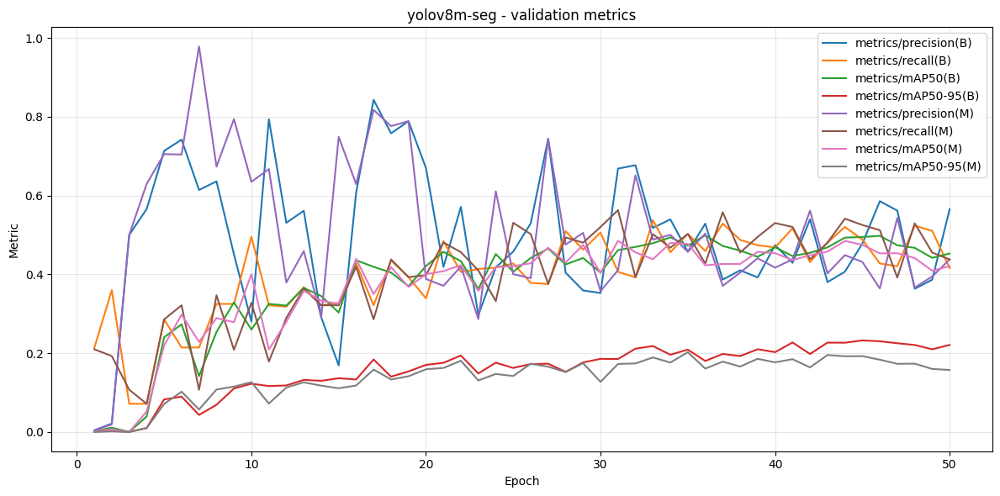

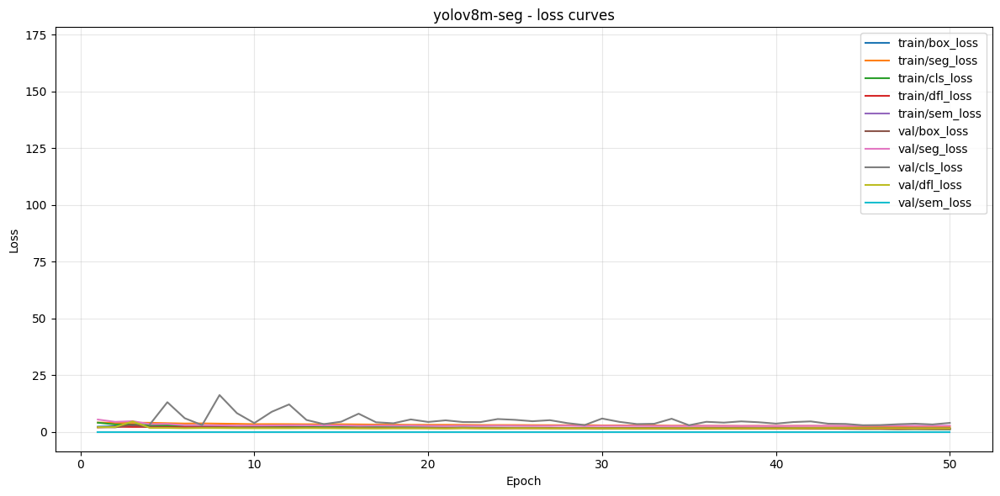

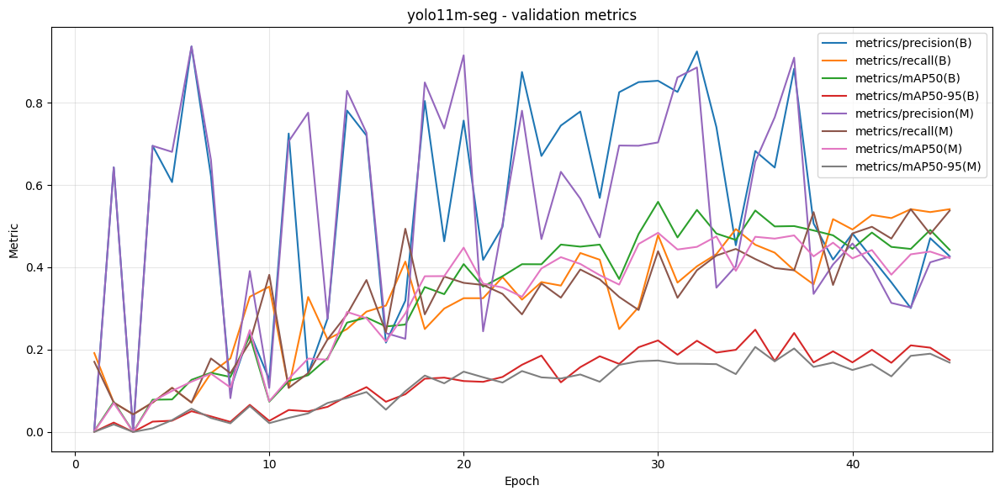

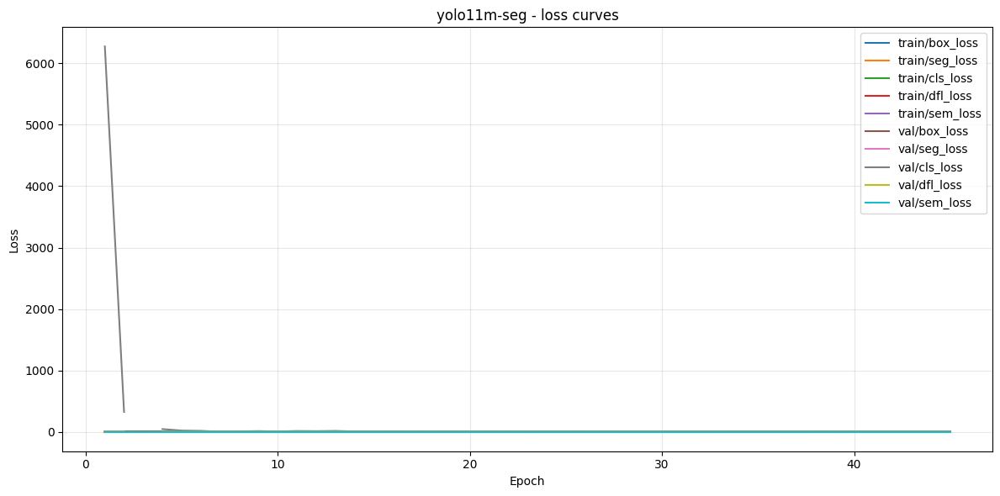

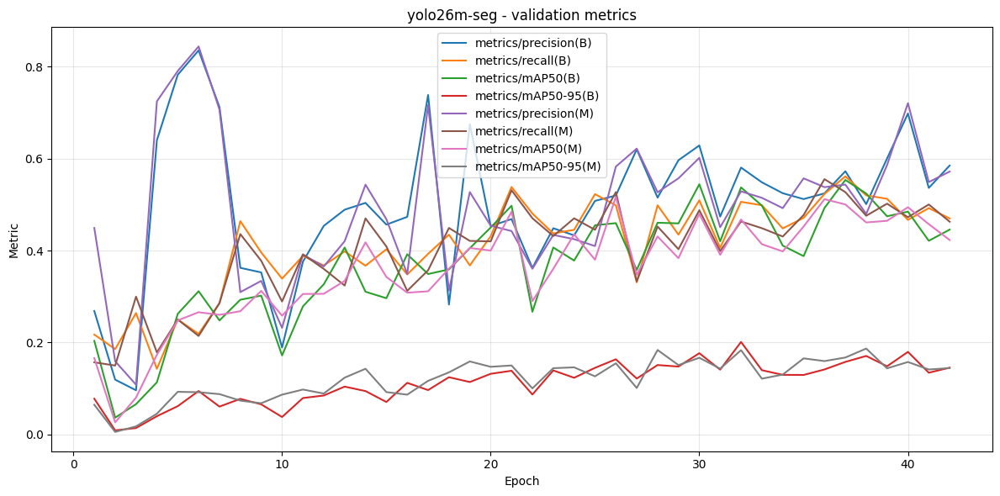

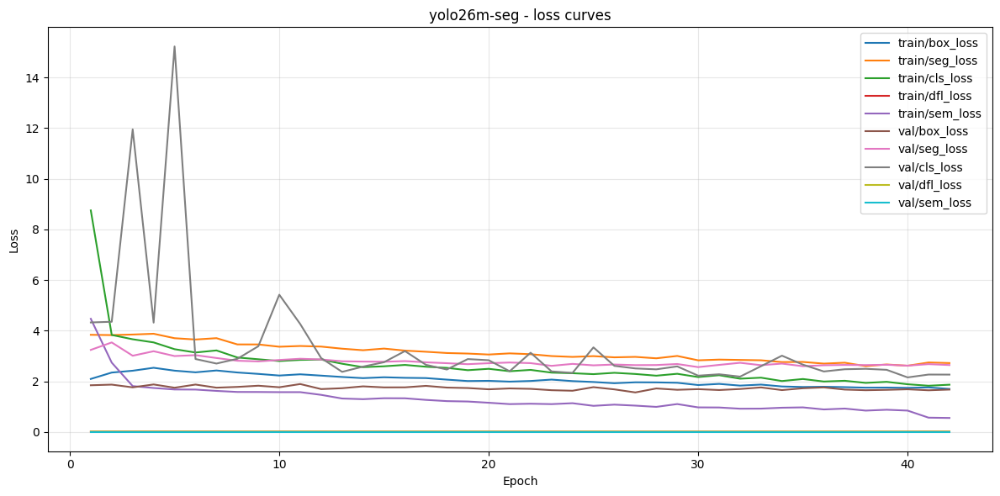

In [14]:
def plot_results_csv(run_dir, model_name):
    csv_path = Path(run_dir) / "results.csv"
    if not csv_path.exists():
        print("Missing results.csv:", csv_path)
        return None
    r = pd.read_csv(csv_path)
    r.columns = [c.strip() for c in r.columns]
    r.to_csv(EXPORT_DIR / f"{model_name}_results.csv", index=False)

    metric_cols = [c for c in r.columns if any(k in c.lower() for k in ["map", "precision", "recall"])]
    loss_cols = [c for c in r.columns if "loss" in c.lower()]

    if metric_cols:
        plt.figure(figsize=(12, 6))
        for c in metric_cols:
            plt.plot(r["epoch"], r[c], label=c)
        plt.title(f"{model_name} - validation metrics")
        plt.xlabel("Epoch")
        plt.ylabel("Metric")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / f"{model_name}_metrics_curves.png", dpi=200)
        plt.show()

    if loss_cols:
        plt.figure(figsize=(12, 6))
        for c in loss_cols:
            plt.plot(r["epoch"], r[c], label=c)
        plt.title(f"{model_name} - loss curves")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / f"{model_name}_loss_curves.png", dpi=200)
        plt.show()
    return r

for rec in train_records:
    if rec.get("status") == "ok" and rec.get("run_dir"):
        plot_results_csv(rec["run_dir"], rec["model"])

## 13. Validate/Test và lưu tất cả metric

Notebook chạy `model.val()` trên cả `val` và `test`. Các metric chính:

- Box Precision/Recall/mAP50/mAP50-95
- Mask Precision/Recall/mAP50/mAP50-95
- Per-class box mAP và mask mAP nếu Ultralytics trả về
- Speed preprocess/inference/loss/postprocess
- Size file weight

In [15]:
def safe_getattr(obj, attr, default=None):
    try:
        return getattr(obj, attr)
    except Exception:
        return default


def extract_metrics(result, model_name, split_name, weight_path):
    row = {
        "model": model_name,
        "split": split_name,
        "weight_path": str(weight_path),
        "weight_size_mb": Path(weight_path).stat().st_size / (1024 ** 2) if Path(weight_path).exists() else None,
    }

    # results_dict chứa nhiều metric với key chuẩn của Ultralytics
    try:
        for k, v in result.results_dict.items():
            row[k] = float(v) if isinstance(v, (int, float, np.floating)) else v
    except Exception:
        pass

    for prefix, box_obj in [("box", safe_getattr(result, "box")), ("seg", safe_getattr(result, "seg"))]:
        if box_obj is None:
            continue
        for attr in ["mp", "mr", "map50", "map", "map75"]:
            val = safe_getattr(box_obj, attr)
            if val is not None:
                try:
                    row[f"{prefix}_{attr}"] = float(val)
                except Exception:
                    row[f"{prefix}_{attr}"] = val

    speed = safe_getattr(result, "speed", {}) or {}
    for k, v in speed.items():
        row[f"speed_{k}_ms"] = v

    return row


def extract_per_class_metrics(result, model_name, split_name):
    rows = []
    names = getattr(result, "names", None) or {i: n for i, n in enumerate(CLASS_NAMES)}
    box_maps = safe_getattr(safe_getattr(result, "box"), "maps", None)
    seg_maps = safe_getattr(safe_getattr(result, "seg"), "maps", None)

    n = len(CLASS_NAMES)
    for cid in range(n):
        rows.append({
            "model": model_name,
            "split": split_name,
            "class_id": cid,
            "class_name": names.get(cid, CLASS_NAMES[cid] if cid < len(CLASS_NAMES) else str(cid)) if isinstance(names, dict) else CLASS_NAMES[cid],
            "box_map50_95": float(box_maps[cid]) if box_maps is not None and len(box_maps) > cid else None,
            "seg_map50_95": float(seg_maps[cid]) if seg_maps is not None and len(seg_maps) > cid else None,
        })
    return rows

valtest_rows = []
per_class_rows = []

for model_name, weight_path in best_weights.items():
    if not weight_path or not Path(weight_path).exists():
        print("Skip missing weight:", model_name, weight_path)
        continue
    model = YOLO(weight_path)
    for split_name in ["val", "test"]:
        print(f"\nValidating {model_name} on {split_name}")
        result = model.val(
            data=str(ACTIVE_DATA_YAML),
            split=split_name,
            imgsz=IMG_SIZE,
            batch=BATCH,
            device=DEVICE,
            plots=True,
            save_json=True,
            project=str(RUNS_DIR / "valtest"),
            name=f"{model_name}_{split_name}",
            exist_ok=True,
            verbose=False,
        )
        valtest_rows.append(extract_metrics(result, model_name, split_name, weight_path))
        per_class_rows.extend(extract_per_class_metrics(result, model_name, split_name))

metrics_df = pd.DataFrame(valtest_rows)
per_class_df = pd.DataFrame(per_class_rows)

metrics_csv = EXPORT_DIR / "val_test_metrics_summary.csv"
per_class_csv = EXPORT_DIR / "per_class_metrics.csv"
metrics_df.to_csv(metrics_csv, index=False)
per_class_df.to_csv(per_class_csv, index=False)

print("Saved:", metrics_csv)
print("Saved:", per_class_csv)
display(metrics_df)
display(per_class_df)


Validating yolov8m-seg on val
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8m-seg summary (fused): 106 layers, 27,223,542 parameters, 0 gradients, 104.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2836.4±538.4 MB/s, size: 172.4 KB)
val: Scanning /kaggle/working/shrimp_yolo_seg_benchmark/split_balanced/labels/val.cache... 169 images, 83 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 169/169 70.9Mit/s 0.0s
requirements: Ultralytics requirement ['faster-coco-eval>=1.6.7'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 376ms
Prepared 1 package in 73ms
Installed 1 package in 6ms
 + faster-coco-eval==1.7.2

requirements: AutoUpdate success ✅ 0.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 22/22 1

,model,split,weight_path,weight_size_mb,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),metrics/precision(M),metrics/recall(M),...,box_map75,seg_mp,seg_mr,seg_map50,seg_map,seg_map75,speed_preprocess_ms,speed_inference_ms,speed_loss_ms,speed_postprocess_ms
0,yolov8m-seg,val,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,52.287563,0.477465,0.489139,0.494249,0.232402,0.425793,0.526197,...,0.200339,0.425793,0.526197,0.465623,0.195792,0.066739,2.074388,33.240066,0.001084,4.580548
1,yolov8m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,52.287563,0.481912,0.315686,0.304680,0.151242,0.415533,0.345098,...,0.132281,0.415533,0.345098,0.283923,0.115209,0.063422,1.723909,34.220362,0.001109,4.585315
2,yolo11m-seg,val,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,43.066702,0.682884,0.454780,0.538080,0.248536,0.656624,0.420005,...,0.176428,0.656624,0.420005,0.474919,0.208032,0.099419,1.999852,38.985630,0.001409,9.035250
3,yolo11m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,43.066702,0.624567,0.373203,0.427311,0.197139,0.425718,0.366013,...,0.185073,0.425718,0.366013,0.359328,0.155629,0.131365,1.077844,39.134537,0.001533,8.939072
4,yolo26m-seg,val,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,51.954087,0.579143,0.506036,0.538175,0.197805,0.517387,0.459759,...,0.063631,0.517387,0.459759,0.464077,0.184178,0.049731,1.569520,41.285491,0.001136,4.794382
5,yolo26m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,51.954087,0.466343,0.388889,0.372345,0.186266,0.516422,0.398693,...,0.176955,0.516422,0.398693,0.369042,0.161175,0.081744,1.079366,40.933948,0.001093,4.548289


,model,split,class_id,class_name,box_map50_95,seg_map50_95
0,yolov8m-seg,val,0,blackgill,0.398788,0.338367
1,yolov8m-seg,val,1,whitespot,0.066016,0.053218
2,yolov8m-seg,test,0,blackgill,0.253687,0.193494
3,yolov8m-seg,test,1,whitespot,0.048796,0.036923
4,yolo11m-seg,val,0,blackgill,0.430085,0.372674
5,yolo11m-seg,val,1,whitespot,0.066987,0.043390
6,yolo11m-seg,test,0,blackgill,0.344656,0.280453
7,yolo11m-seg,test,1,whitespot,0.049622,0.030804
8,yolo26m-seg,val,0,blackgill,0.330502,0.327515
9,yolo26m-seg,val,1,whitespot,0.065109,0.040841


## 14. Benchmark inference speed và FPS trên test set

Cell này đo tốc độ thực tế bằng `model.predict()` từng ảnh test, đồng thời lưu số box/mask dự đoán.

In [16]:
BENCHMARK_MAX_IMAGES = 200
TEST_IMAGES_DIR = ACTIVE_SPLIT_DIR / "images" / "test"
test_images = sorted([p for p in TEST_IMAGES_DIR.iterdir() if p.suffix.lower() in IMAGE_EXTS])[:BENCHMARK_MAX_IMAGES]
print("Benchmark images:", len(test_images), "from", TEST_IMAGES_DIR)

bench_rows = []
for model_name, weight_path in best_weights.items():
    if not Path(weight_path).exists():
        continue
    print("\nBenchmark:", model_name)
    model = YOLO(weight_path)
    # warmup
    if test_images:
        _ = model.predict(str(test_images[0]), imgsz=IMG_SIZE, conf=CONF_THRES, iou=IOU_THRES, device=DEVICE, verbose=False)

    for img_path in tqdm(test_images, desc=model_name):
        t0 = time.perf_counter()
        preds = model.predict(str(img_path), imgsz=IMG_SIZE, conf=CONF_THRES, iou=IOU_THRES, device=DEVICE, verbose=False)
        wall_ms = (time.perf_counter() - t0) * 1000
        r = preds[0]
        speed = getattr(r, "speed", {}) or {}
        n_boxes = len(r.boxes) if r.boxes is not None else 0
        n_masks = len(r.masks) if r.masks is not None else 0
        bench_rows.append({
            "model": model_name,
            "image": img_path.name,
            "wall_time_ms": wall_ms,
            "preprocess_ms": speed.get("preprocess"),
            "inference_ms": speed.get("inference"),
            "postprocess_ms": speed.get("postprocess"),
            "num_boxes": n_boxes,
            "num_masks": n_masks,
        })

bench_df = pd.DataFrame(bench_rows)
bench_csv = EXPORT_DIR / "inference_benchmark_raw.csv"
bench_df.to_csv(bench_csv, index=False)

summary = bench_df.groupby("model").agg(
    images=("image", "count"),
    avg_wall_time_ms=("wall_time_ms", "mean"),
    std_wall_time_ms=("wall_time_ms", "std"),
    avg_preprocess_ms=("preprocess_ms", "mean"),
    avg_inference_ms=("inference_ms", "mean"),
    avg_postprocess_ms=("postprocess_ms", "mean"),
    avg_num_boxes=("num_boxes", "mean"),
    avg_num_masks=("num_masks", "mean"),
).reset_index()
summary["fps_wall"] = 1000.0 / summary["avg_wall_time_ms"]
summary["fps_inference_only"] = 1000.0 / summary["avg_inference_ms"]
summary_csv = EXPORT_DIR / "inference_benchmark_summary.csv"
summary.to_csv(summary_csv, index=False)

print("Saved:", bench_csv)
print("Saved:", summary_csv)
display(summary)

Benchmark images: 169 from /kaggle/working/shrimp_yolo_seg_benchmark/split_balanced/images/test

Benchmark: yolov8m-seg


yolov8m-seg:   0%|          | 0/169 [00:00<?, ?it/s]


Benchmark: yolo11m-seg


yolo11m-seg:   0%|          | 0/169 [00:00<?, ?it/s]


Benchmark: yolo26m-seg


yolo26m-seg:   0%|          | 0/169 [00:00<?, ?it/s]

Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/inference_benchmark_raw.csv
Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/inference_benchmark_summary.csv


,model,images,avg_wall_time_ms,std_wall_time_ms,avg_preprocess_ms,avg_inference_ms,avg_postprocess_ms,avg_num_boxes,avg_num_masks,fps_wall,fps_inference_only
0,yolo11m-seg,169,47.598583,2.428380,3.154084,27.319442,0.909394,0.295858,0.295858,21.009029,36.603968
1,yolo26m-seg,169,49.536283,2.288192,3.172520,29.666978,0.345348,0.118343,0.118343,20.187223,33.707512
2,yolov8m-seg,169,44.459240,3.925207,3.170902,23.885213,0.984415,0.313609,0.313609,22.492512,41.866907


## 15. Predict và plot kết quả dự đoán

Mỗi model sẽ predict một tập ảnh test mẫu và lưu ảnh có mask/box vào thư mục `predictions`.

Sample images: ['Shrimp_318-2-_jpg.rf.0dbba7d8d0f9fd1951ddb61c556f4ad3.jpg', 'Shrimp_319-2-_jpg.rf.83f6969ca9cfe254c3bd7a2ed24281ab.jpg', 'Shrimp_322-3-_jpg.rf.6978857f76e7874078c866ea3ce51a0f.jpg', 'Shrimp_323-2-_jpg.rf.d350aaa17c3d601c8da69d064eb35de7.jpg', 'Shrimp_328-1-_jpg.rf.9d6e6536d6fb158b7d91d1d44b50b761.jpg', 'Shrimp_330-3-_jpg.rf.42b8b0de59dc736a2741e3134f867e72.jpg', 'Shrimp_332-2-_jpg.rf.f8f34768ca58fc6939eb544d45ae072f.jpg', 'Shrimp_332-3-_jpg.rf.37a542b7716c420cb40dd208141c8016.jpg', 'Shrimp_333-3-_jpg.rf.608f7d15bc86251c13aaa58422d1f64e.jpg', 'Shrimp_334-3-_jpg.rf.a9b7d9a69a7d2ec21453e66c1db0b79e.jpg', 'Shrimp_336-1-_jpg.rf.020eaa6634c859fd9643f552b63eaa67.jpg', 'Shrimp_336-3-_jpg.rf.930a05ddc643071beb82ac80056f9085.jpg']
Results saved to /kaggle/working/shrimp_yolo_seg_benchmark/predictions/yolov8m-seg
3 labels saved to /kaggle/working/shrimp_yolo_seg_benchmark/predictions/yolov8m-seg/labels
yolov8m-seg -> /kaggle/working/shrimp_yolo_seg_benchmark/predictions/yolov8m-s

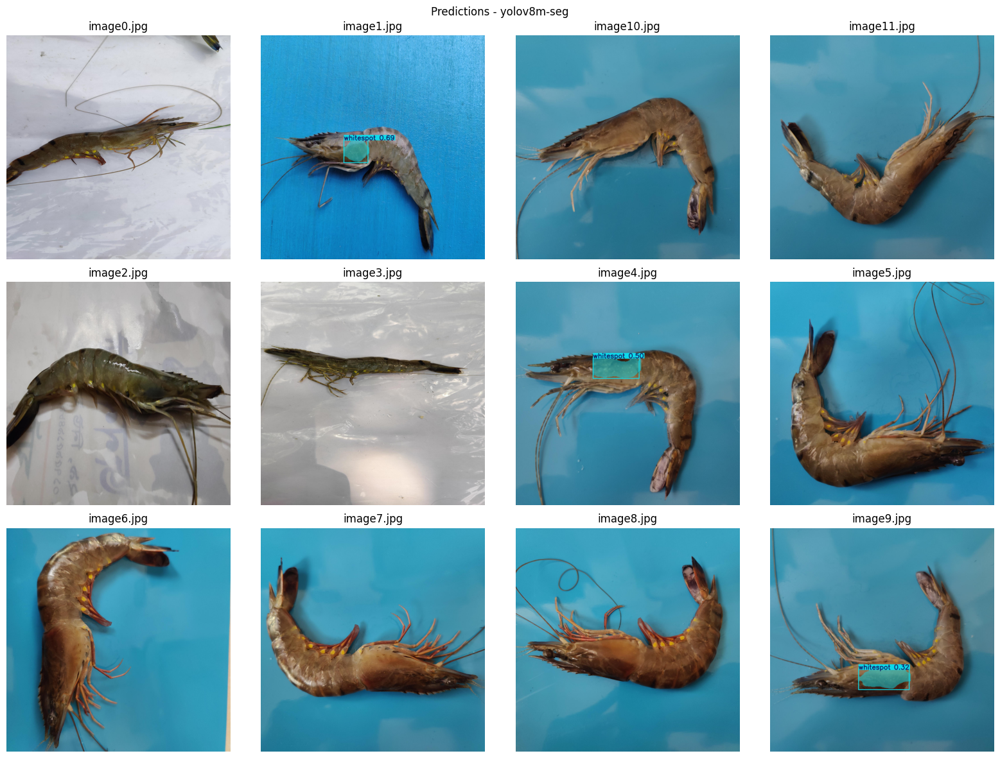

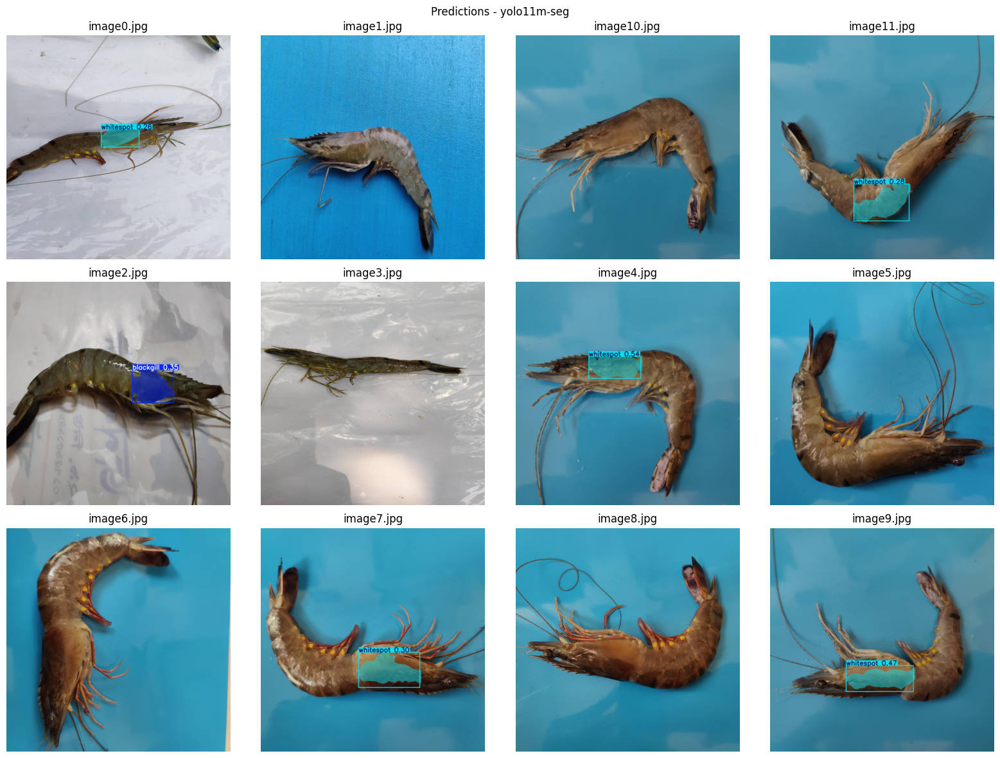

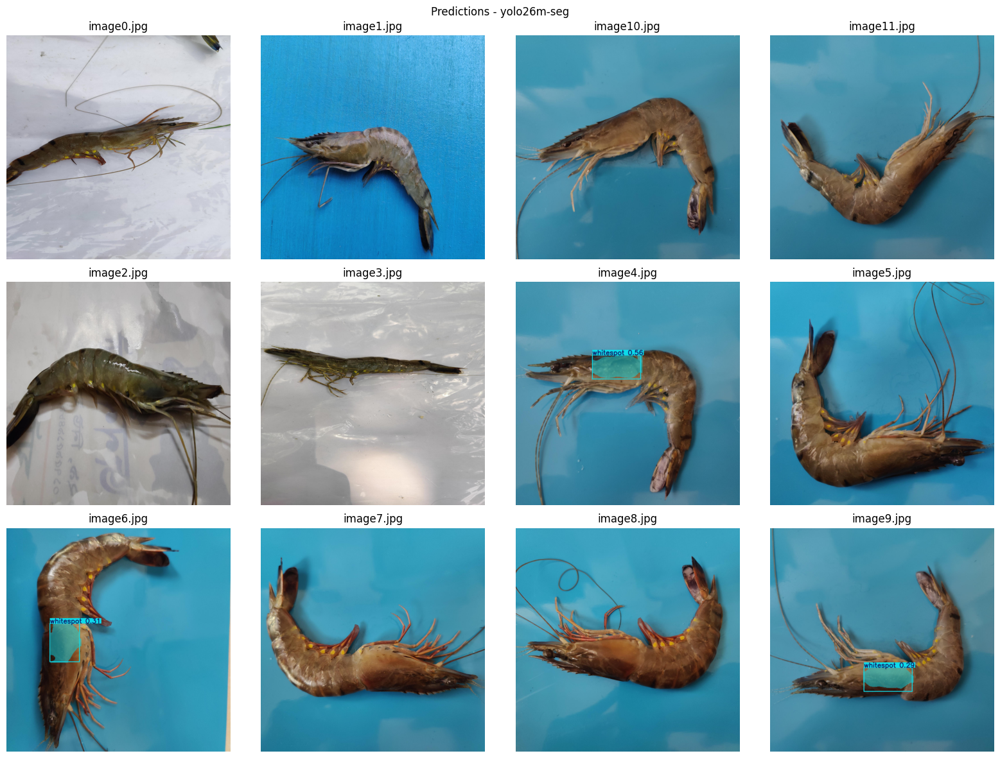

In [17]:
PREDICT_SAMPLE_SIZE = 12
sample_test_images = test_images[:PREDICT_SAMPLE_SIZE]
print("Sample images:", [p.name for p in sample_test_images])

predict_dirs = {}
for model_name, weight_path in best_weights.items():
    if not Path(weight_path).exists():
        continue
    model = YOLO(weight_path)
    out = model.predict(
        source=[str(p) for p in sample_test_images],
        imgsz=IMG_SIZE,
        conf=CONF_THRES,
        iou=IOU_THRES,
        device=DEVICE,
        save=True,
        save_txt=True,
        save_conf=True,
        project=str(PRED_DIR),
        name=model_name,
        exist_ok=True,
        verbose=False,
    )
    predict_dirs[model_name] = str(PRED_DIR / model_name)
    print(model_name, "->", predict_dirs[model_name])


def make_montage(image_files, title, save_path, cols=4):
    imgs = []
    for p in image_files:
        im = cv2.imread(str(p))
        if im is None:
            continue
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        imgs.append((p.name, im))
    if not imgs:
        print("No images for montage:", title)
        return
    rows = math.ceil(len(imgs) / cols)
    plt.figure(figsize=(cols * 4, rows * 4))
    for i, (name, im) in enumerate(imgs, start=1):
        plt.subplot(rows, cols, i)
        plt.imshow(im)
        plt.title(name[:30])
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200)
    plt.show()

for model_name, pdir in predict_dirs.items():
    image_files = sorted([p for p in Path(pdir).glob("*") if p.suffix.lower() in IMAGE_EXTS])[:PREDICT_SAMPLE_SIZE]
    make_montage(image_files, f"Predictions - {model_name}", PLOTS_DIR / f"predictions_montage_{model_name}.png")

## 16. Plot so sánh metric giữa các model

Cell này tạo các biểu đồ chính để đưa vào báo cáo: mask mAP, box mAP, inference time, FPS.

,model,split,weight_path,weight_size_mb,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),metrics/precision(M),metrics/recall(M),...,speed_loss_ms,speed_postprocess_ms,box_mAP50,box_mAP50_95,mask_mAP50,mask_mAP50_95,box_precision,box_recall,mask_precision,mask_recall
1,yolov8m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,52.287563,0.481912,0.315686,0.304680,0.151242,0.415533,0.345098,...,0.001109,4.585315,0.304680,0.151242,0.283923,0.115209,0.481912,0.315686,0.415533,0.345098
3,yolo11m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,43.066702,0.624567,0.373203,0.427311,0.197139,0.425718,0.366013,...,0.001533,8.939072,0.427311,0.197139,0.359328,0.155629,0.624567,0.373203,0.425718,0.366013
5,yolo26m-seg,test,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,51.954087,0.466343,0.388889,0.372345,0.186266,0.516422,0.398693,...,0.001093,4.548289,0.372345,0.186266,0.369042,0.161175,0.466343,0.388889,0.516422,0.398693


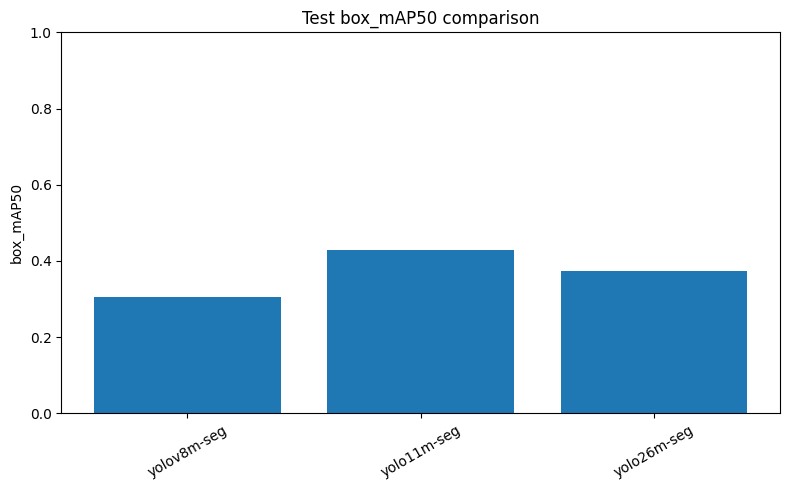

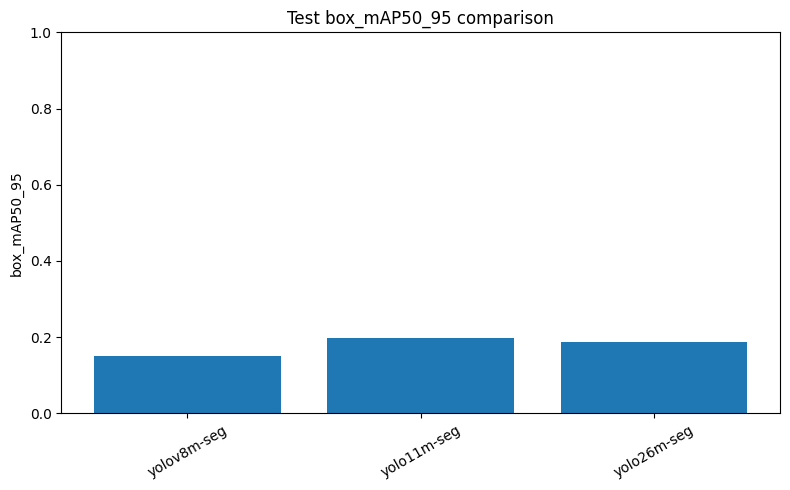

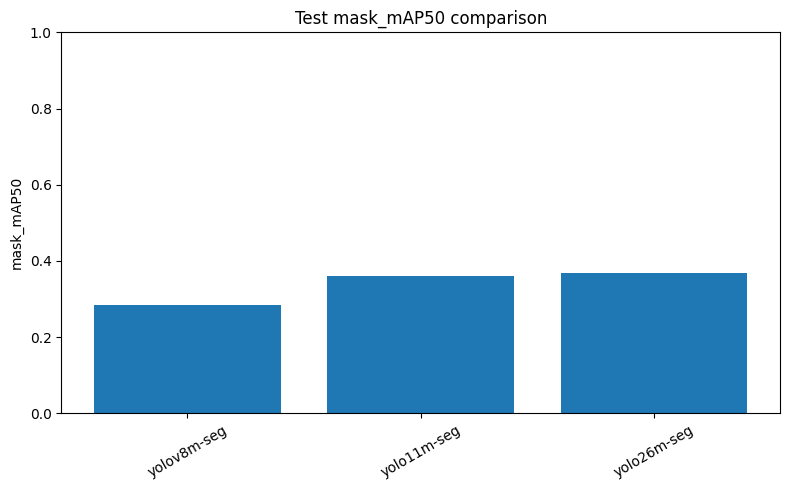

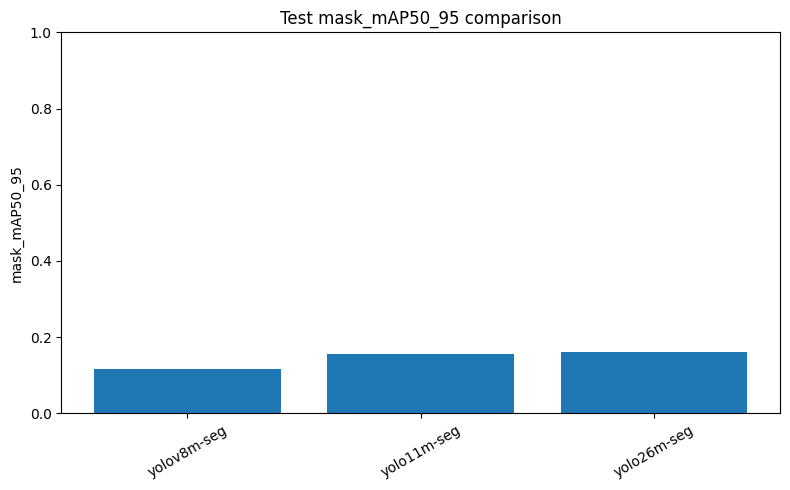

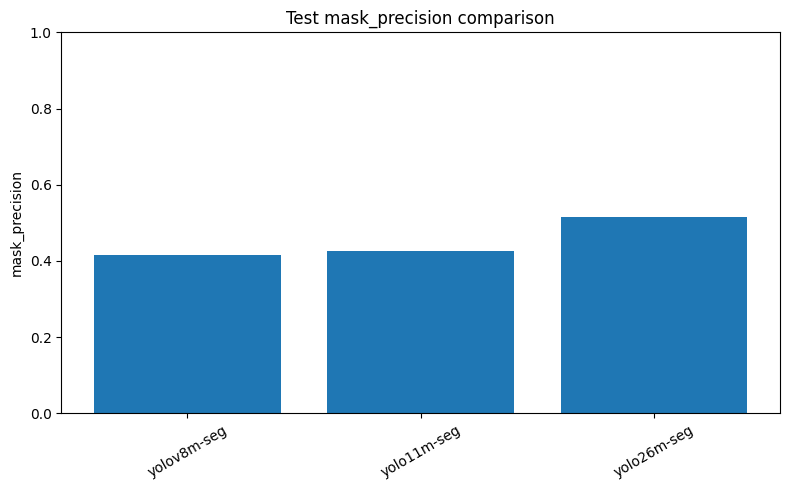

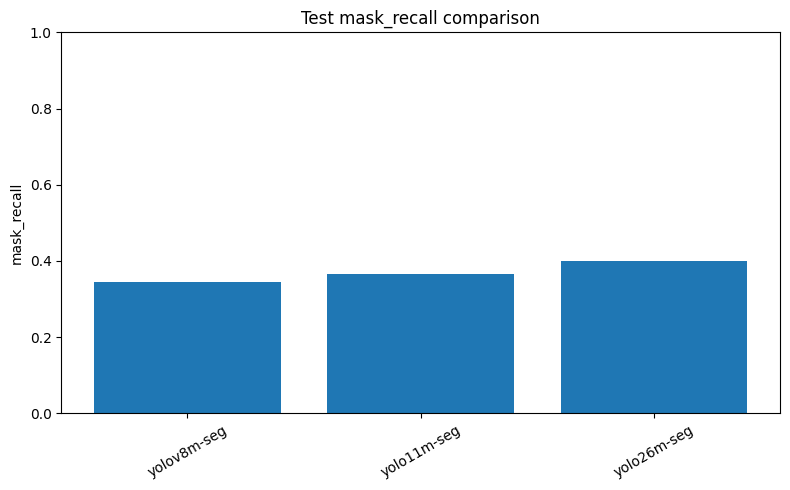

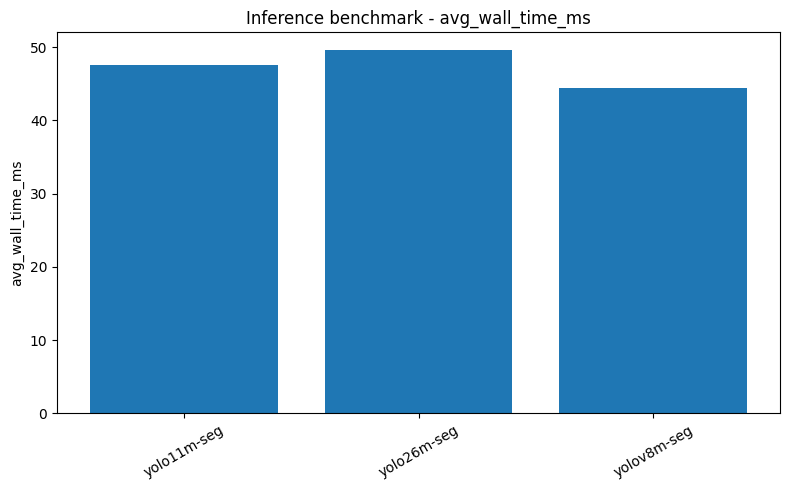

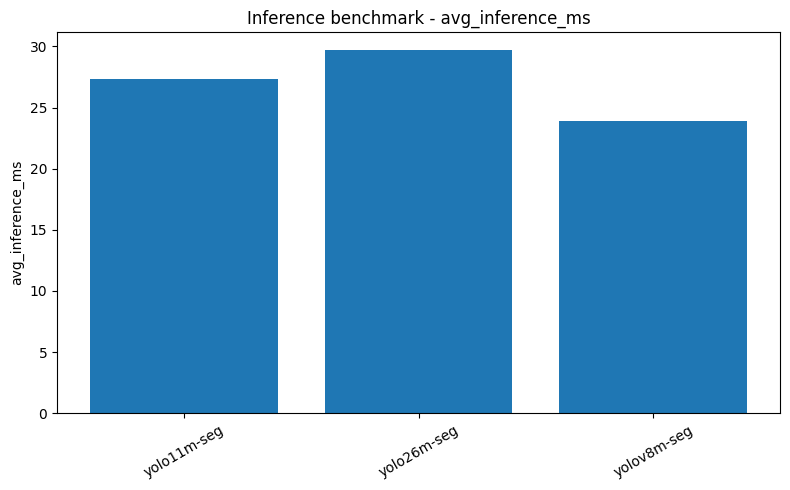

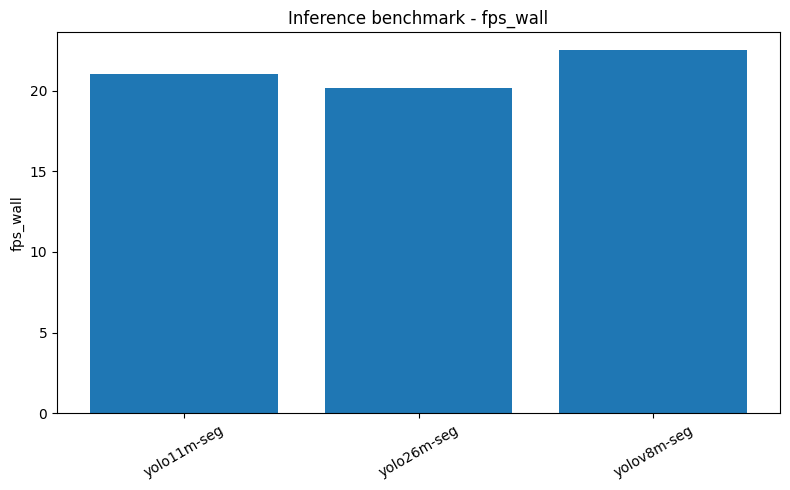

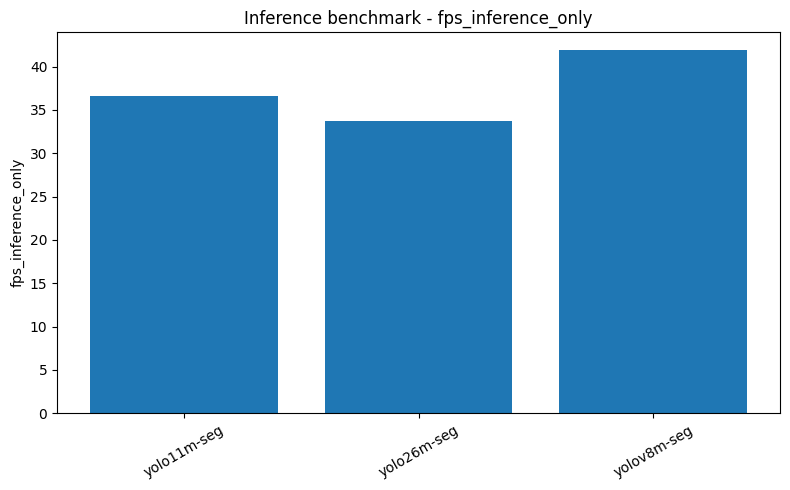

In [18]:
# Chỉ lấy test split cho bảng so sánh chính
compare_df = metrics_df[metrics_df["split"] == "test"].copy() if len(metrics_df) else pd.DataFrame()
if len(compare_df):
    # Chuẩn hóa tên cột metric phổ biến
    possible_cols = {
        "box_mAP50": ["box_map50", "metrics/mAP50(B)"],
        "box_mAP50_95": ["box_map", "metrics/mAP50-95(B)"],
        "mask_mAP50": ["seg_map50", "metrics/mAP50(M)"],
        "mask_mAP50_95": ["seg_map", "metrics/mAP50-95(M)"],
        "box_precision": ["box_mp", "metrics/precision(B)"],
        "box_recall": ["box_mr", "metrics/recall(B)"],
        "mask_precision": ["seg_mp", "metrics/precision(M)"],
        "mask_recall": ["seg_mr", "metrics/recall(M)"],
    }
    for new_col, candidates in possible_cols.items():
        for c in candidates:
            if c in compare_df.columns:
                compare_df[new_col] = compare_df[c]
                break

    display(compare_df)

    metric_plot_cols = [c for c in ["box_mAP50", "box_mAP50_95", "mask_mAP50", "mask_mAP50_95", "mask_precision", "mask_recall"] if c in compare_df.columns]
    for c in metric_plot_cols:
        plt.figure(figsize=(8, 5))
        plt.bar(compare_df["model"], compare_df[c])
        plt.title(f"Test {c} comparison")
        plt.ylabel(c)
        plt.xticks(rotation=30)
        plt.ylim(0, 1.0)
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / f"compare_{c}.png", dpi=200)
        plt.show()

if 'summary' in globals() and len(summary):
    for c in ["avg_wall_time_ms", "avg_inference_ms", "fps_wall", "fps_inference_only"]:
        plt.figure(figsize=(8, 5))
        plt.bar(summary["model"], summary[c])
        plt.title(f"Inference benchmark - {c}")
        plt.ylabel(c)
        plt.xticks(rotation=30)
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / f"compare_{c}.png", dpi=200)
        plt.show()

## 17. Tạo bảng benchmark cuối cùng

Bảng cuối gồm metric test + speed + size weight để dùng trực tiếp trong báo cáo.

In [19]:
final_df = compare_df.copy() if 'compare_df' in globals() and len(compare_df) else pd.DataFrame()
if len(final_df) and 'summary' in globals() and len(summary):
    final_df = final_df.merge(summary, on="model", how="left")

# Chọn cột quan trọng nếu tồn tại
preferred_cols = [
    "model", "split", "weight_size_mb",
    "box_precision", "box_recall", "box_mAP50", "box_mAP50_95",
    "mask_precision", "mask_recall", "mask_mAP50", "mask_mAP50_95",
    "avg_wall_time_ms", "avg_inference_ms", "fps_wall", "fps_inference_only",
    "avg_num_boxes", "avg_num_masks",
]
cols = [c for c in preferred_cols if c in final_df.columns]
extra_cols = [c for c in final_df.columns if c not in cols]
final_df = final_df[cols + extra_cols]

final_csv = EXPORT_DIR / "final_yolo_seg_benchmark.csv"
final_json = EXPORT_DIR / "final_yolo_seg_benchmark.json"
final_df.to_csv(final_csv, index=False)
final_df.to_json(final_json, orient="records", indent=2, force_ascii=False)

print("Saved:", final_csv)
print("Saved:", final_json)
display(final_df)

Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/final_yolo_seg_benchmark.csv
Saved: /kaggle/working/shrimp_yolo_seg_benchmark/exports/final_yolo_seg_benchmark.json


,model,split,weight_size_mb,box_precision,box_recall,box_mAP50,box_mAP50_95,mask_precision,mask_recall,mask_mAP50,...,seg_map,seg_map75,speed_preprocess_ms,speed_inference_ms,speed_loss_ms,speed_postprocess_ms,images,std_wall_time_ms,avg_preprocess_ms,avg_postprocess_ms
0,yolov8m-seg,test,52.287563,0.481912,0.315686,0.304680,0.151242,0.415533,0.345098,0.283923,...,0.115209,0.063422,1.723909,34.220362,0.001109,4.585315,169,3.925207,3.170902,0.984415
1,yolo11m-seg,test,43.066702,0.624567,0.373203,0.427311,0.197139,0.425718,0.366013,0.359328,...,0.155629,0.131365,1.077844,39.134537,0.001533,8.939072,169,2.428380,3.154084,0.909394
2,yolo26m-seg,test,51.954087,0.466343,0.388889,0.372345,0.186266,0.516422,0.398693,0.369042,...,0.161175,0.081744,1.079366,40.933948,0.001093,4.548289,169,2.288192,3.172520,0.345348


## 18. Export model sang ONNX/TFLite tùy chọn

Cell này để chuẩn bị cho Android/edge deployment. Mặc định tắt để tiết kiệm thời gian trên Kaggle.

In [22]:
EXPORT_MODELS = True
EXPORT_FORMATS = ["onnx"]  # có thể thêm "tflite" nếu cần

if EXPORT_MODELS:
    export_rows = []
    for model_name, weight_path in best_weights.items():
        if not Path(weight_path).exists():
            continue
        model = YOLO(weight_path)
        for fmt in EXPORT_FORMATS:
            try:
                out_path = model.export(format=fmt, imgsz=IMG_SIZE, device=DEVICE)
                export_rows.append({"model": model_name, "format": fmt, "path": str(out_path), "status": "ok"})
            except Exception as e:
                export_rows.append({"model": model_name, "format": fmt, "path": "", "status": "failed", "error": repr(e)})
    export_df = pd.DataFrame(export_rows)
    export_df.to_csv(EXPORT_DIR / "model_export_summary.csv", index=False)
    display(export_df)
else:
    print("EXPORT_MODELS=False. Bật True nếu muốn export ONNX/TFLite.")

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv8m-seg summary (fused): 106 layers, 27,223,542 parameters, 0 gradients, 104.3 GFLOPs

PyTorch: starting from '/kaggle/working/shrimp_yolo_seg_benchmark/runs/yolov8m-seg_img640_ep50_balanced/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 38, 8400), (1, 32, 160, 160)) (52.3 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 272ms
Prepared 2 packages in 3.42s
Installed 2 packages in 10ms
 + onnxruntime-gpu==1.26.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 3.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 

,model,format,path,status
0,yolov8m-seg,onnx,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,ok
1,yolo11m-seg,onnx,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,ok
2,yolo26m-seg,onnx,/kaggle/working/shrimp_yolo_seg_benchmark/runs...,ok


## 19. Nén toàn bộ kết quả để download

Sau khi chạy xong, tải file ZIP này từ `/kaggle/working`.

In [21]:
zip_path = shutil.make_archive(str(WORK_DIR), "zip", root_dir=str(WORK_DIR))
print("Created ZIP:", zip_path)
print("Key outputs:")
for p in [
    EXPORT_DIR / "final_yolo_seg_benchmark.csv",
    EXPORT_DIR / "val_test_metrics_summary.csv",
    EXPORT_DIR / "per_class_metrics.csv",
    EXPORT_DIR / "inference_benchmark_summary.csv",
    PLOTS_DIR,
]:
    print("-", p)

Created ZIP: /kaggle/working/shrimp_yolo_seg_benchmark.zip
Key outputs:
- /kaggle/working/shrimp_yolo_seg_benchmark/exports/final_yolo_seg_benchmark.csv
- /kaggle/working/shrimp_yolo_seg_benchmark/exports/val_test_metrics_summary.csv
- /kaggle/working/shrimp_yolo_seg_benchmark/exports/per_class_metrics.csv
- /kaggle/working/shrimp_yolo_seg_benchmark/exports/inference_benchmark_summary.csv
- /kaggle/working/shrimp_yolo_seg_benchmark/plots
